In [43]:
# Import relevant libraries
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# Part 1: Data Preprocessing
1) Load the dataset

In [4]:
SW_with_AOD = pd.read_csv('https://raw.githubusercontent.com/minchen-wisc/fwe458_2025/refs/heads/main/Lec21/SW_with_AOD.csv')
print(SW_with_AOD.head())

         SZA       AOD       COD  CLD_FRAC        UW         TO3    Pressure  \
0  24.936783  1.172892  2.440000  0.286546  2.021502  311.419861  959.085083   
1  34.865055  1.626954  4.630000  0.468832  4.859887  308.713379  968.427551   
2  27.330978  1.095007  2.030000  0.301414  5.278558  293.322052  988.040588   
3  20.361732  1.126541  5.500000  0.377019  4.856422  321.498199  977.610229   
4  13.433228  0.725452  0.736076  0.075378  0.644262  295.448975  882.321411   

     BSA    WSA   SW_direct  SW_diffuse  
0  0.162  0.193  467.191650  300.820007  
1  0.155  0.169  264.900024  385.293335  
2  0.136  0.149  313.553314  321.538361  
3  0.156  0.179  143.902298  501.073639  
4  0.188  0.212  957.331665   79.003334  


2) Check for missing values or obvious outliers.
- We don't have any missing values
- There do seem to be some more extreme values in SW_diffuse, but all other numerical columns do not have outliers, so will not throw out any data

Missing values per column:
SZA           0
AOD           0
COD           0
CLD_FRAC      0
UW            0
TO3           0
Pressure      0
BSA           0
WSA           0
SW_direct     0
SW_diffuse    0
dtype: int64


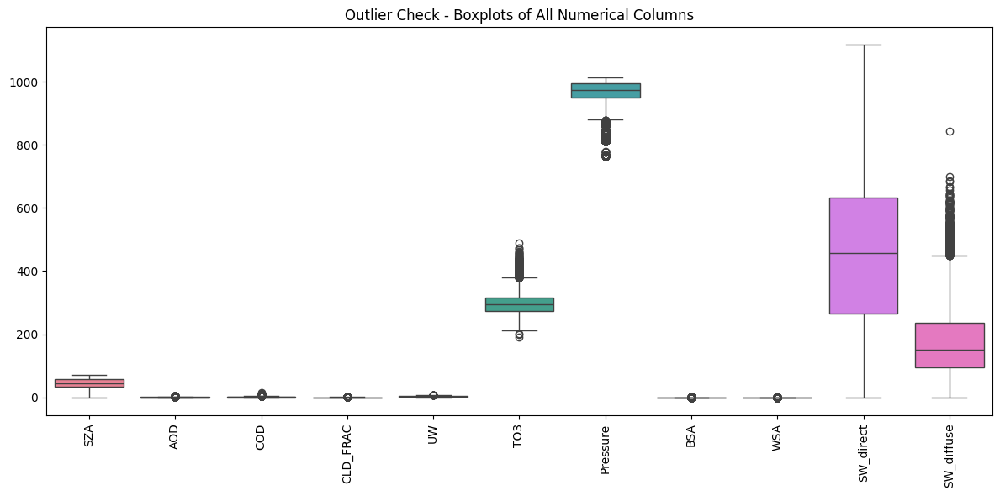

In [5]:
missing_values = SW_with_AOD.isnull().sum()
print("Missing values per column:")
print(missing_values)

# Claude Sonnet code for quick visual check with a compact multi-boxplot to check for outliers
plt.figure(figsize=(12, 6))
plt.title("Outlier Check - Boxplots of All Numerical Columns")
sns.boxplot(data=SW_with_AOD.select_dtypes(include=[np.number]))
plt.xticks(rotation=90)
plt.tight_layout()

3) Create a new column: SW_total = SW_direct + SW_diffuse

4) Create a new categorical column:
SW_total_category based on the quartiles of SW_total, with labels:

    "Q1" (lowest 25%)

    "Q2"

    "Q3"

    "Q4" (highest 25%

In [6]:
# Create the new column by adding SW_direct and SW_diffuse
SW_with_AOD['SW_total'] = SW_with_AOD['SW_direct'] + SW_with_AOD['SW_diffuse']

# Get the quartiles of SW_total
quartiles = SW_with_AOD['SW_total'].quantile([0.25, 0.5, 0.75])

# Create a function we can apply to SW_total that creates the categorical column
def categorize_sw_total(SW_total_value):
  # Use if else logic to check if we are at or below a certain quartile
    if SW_total_value <= quartiles[0.25]:
        return 'Q1'
    elif SW_total_value <= quartiles[0.5]:
        return 'Q2'
    elif SW_total_value <= quartiles[0.75]:
        return 'Q3'
    else:
        return 'Q4'

SW_with_AOD['SW_total_category'] = SW_with_AOD['SW_total'].apply(categorize_sw_total)
print(SW_with_AOD.head())

         SZA       AOD       COD  CLD_FRAC        UW         TO3    Pressure  \
0  24.936783  1.172892  2.440000  0.286546  2.021502  311.419861  959.085083   
1  34.865055  1.626954  4.630000  0.468832  4.859887  308.713379  968.427551   
2  27.330978  1.095007  2.030000  0.301414  5.278558  293.322052  988.040588   
3  20.361732  1.126541  5.500000  0.377019  4.856422  321.498199  977.610229   
4  13.433228  0.725452  0.736076  0.075378  0.644262  295.448975  882.321411   

     BSA    WSA   SW_direct  SW_diffuse     SW_total SW_total_category  
0  0.162  0.193  467.191650  300.820007   768.011658                Q3  
1  0.155  0.169  264.900024  385.293335   650.193359                Q3  
2  0.136  0.149  313.553314  321.538361   635.091675                Q2  
3  0.156  0.179  143.902298  501.073639   644.975937                Q3  
4  0.188  0.212  957.331665   79.003334  1036.334999                Q4  


5) Visual Exploration with Pairplot:

    Use Seaborn’s pairplot to visualize relationships among all features, including:

        All input variables

        SW_direct

        SW_diffuse

        SW_total

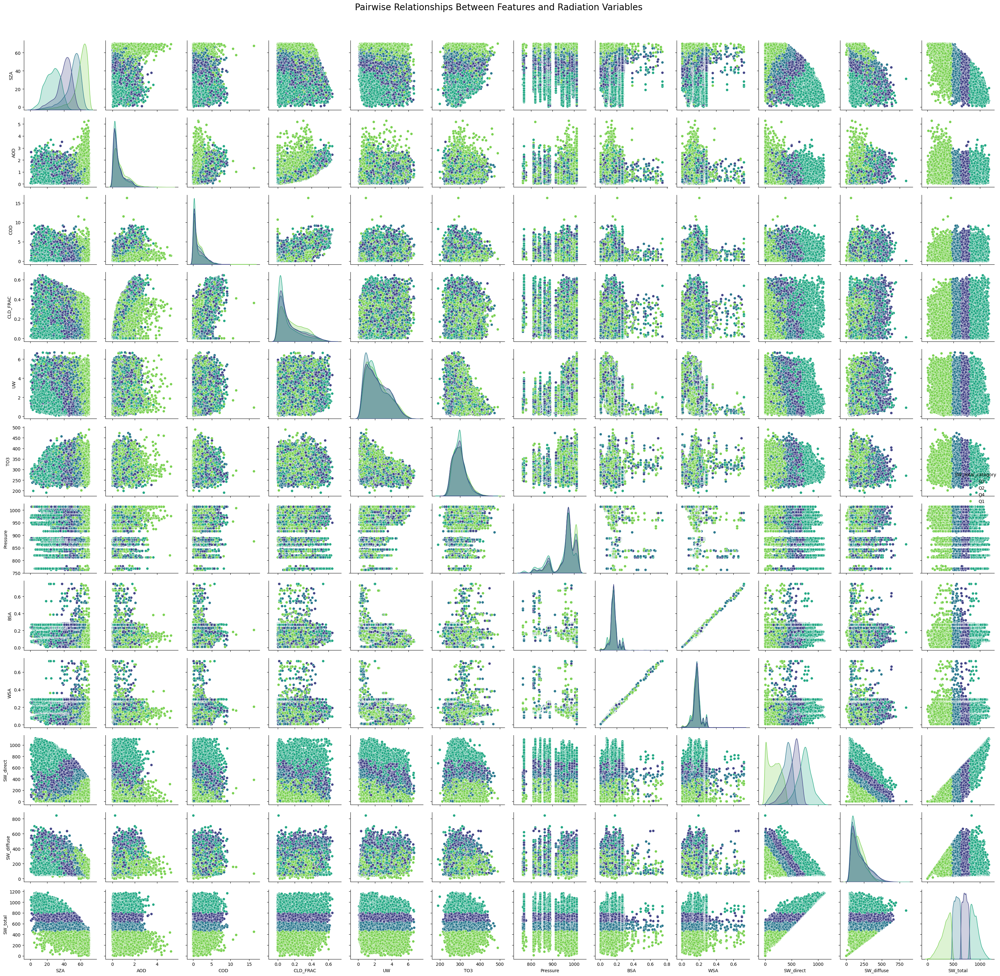

In [6]:
pairplot = sns.pairplot(
    SW_with_AOD,
    hue="SW_total_category",
    palette="viridis"
)

# Adjust the layout and title
pairplot.fig.suptitle('Pairwise Relationships Between Features and Radiation Variables',
                     y=1.02, fontsize=20)
plt.tight_layout()

6) Optional: Normalize or standardize the input features (excluding target variables).
- I am going to use the StandardScaler normalization option in sklearn

In [8]:
independent_feature_names = ['SZA', 'AOD', 'COD', 'CLD_FRAC', 'UW', 'TO3', 'Pressure', 'BSA', 'WSA']
independent_features = SW_with_AOD[independent_feature_names]
targets = SW_with_AOD[['SW_direct', 'SW_diffuse', 'SW_total', 'SW_total_category']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(independent_features)

# Create a new dataframe
SF_with_AOD_scaled = pd.concat([pd.DataFrame(X_scaled, columns = independent_feature_names), targets], axis = 1)
print(SF_with_AOD_scaled.head())

        SZA       AOD       COD  CLD_FRAC        UW       TO3  Pressure  \
0 -1.231391  1.008494  0.737983  1.024862 -0.190759  0.435416  0.004545   
1 -0.588566  1.817881  2.272447  2.362497  1.966451  0.354279  0.182049   
2 -1.076375  0.869661  0.450709  1.133959  2.284647 -0.107136  0.554692   
3 -1.527612  0.925870  2.882028  1.688758  1.963818  0.737553  0.356518   
4 -1.976212  0.210910 -0.455902 -0.524719 -1.237480 -0.043373 -1.453945   

        BSA       WSA   SW_direct  SW_diffuse     SW_total SW_total_category  
0  0.026213  0.386478  467.191650  300.820007   768.011658                Q3  
1 -0.117369 -0.091241  264.900024  385.293335   650.193359                Q3  
2 -0.507092 -0.489340  313.553314  321.538361   635.091675                Q2  
3 -0.096857  0.107808  143.902298  501.073639   644.975937                Q3  
4  0.559518  0.764671  957.331665   79.003334  1036.334999                Q4  


# Part 2: Unsupervised Learning – Radiation Pattern Clustering (3 points)
## 2.1 K-Means Clustering (2 points)

Use the normalized input features (excluding any SW variables) for K-Means clustering.

Use the elbow method to determine the optimal number of clusters.

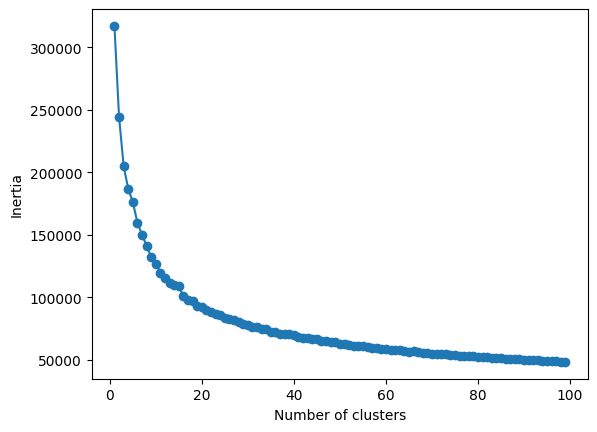

In [15]:
# Copied from your github Lec17 code

inertias = []

for i in range(1,100):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,100), inertias, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [52]:
print('Although there is no abrupt elbow in the elbow method, \nI would say it shows that around 10 clusters is where we get the best return for number of clusters and runtime.')

Although there is no abrupt elbow in the elbow method, 
I would say it shows that around 10 clusters is where we get the best return for number of clusters and runtime.


  1) Visualize the clusters using two selected features (e.g., SZA and AOD).

  2) Analyze whether the clusters align with SW_total_category.


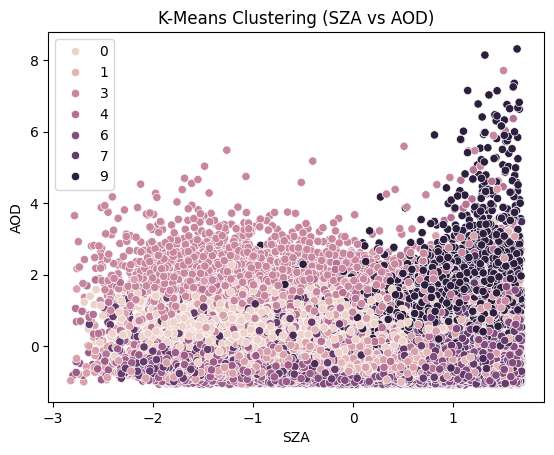

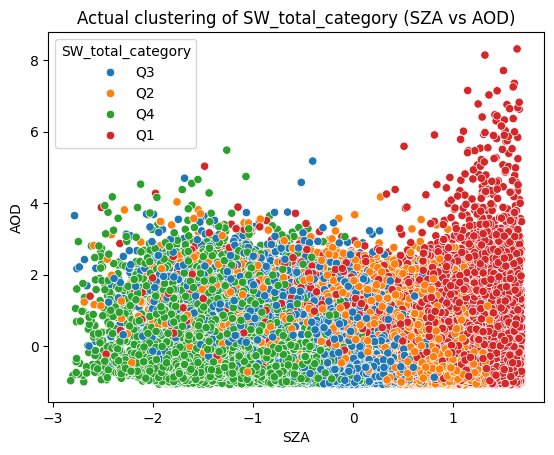

In [27]:
# Run kmeans with optimal 10 clusters
kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(X_scaled)

sns.scatterplot(data=SF_with_AOD_scaled, x='SZA', y='AOD', hue = clusters)
plt.title('K-Means Clustering (SZA vs AOD)')
plt.show()

sns.scatterplot(data=SF_with_AOD_scaled, x='SZA', y='AOD', hue = 'SW_total_category')
plt.title('Actual clustering of SW_total_category (SZA vs AOD)')
plt.show()

# 2.2 Interpretation
Given that I am using 10 clusters and we divide only into 4 quartiles, it is hard to interpret whether the clusters algin with SW_total_category.

Below, I rerun the code but with 4 clusters, and it still does not align very well with the SW_total_category. Rather, the Kmean clusters seem be predominantly determined by AOD rather than the SZA (as seen by difference in colors vertically), whereas the actual data is more determined by SZA (as seen by difference in colors horizontally). So I would say they are not meaningful.

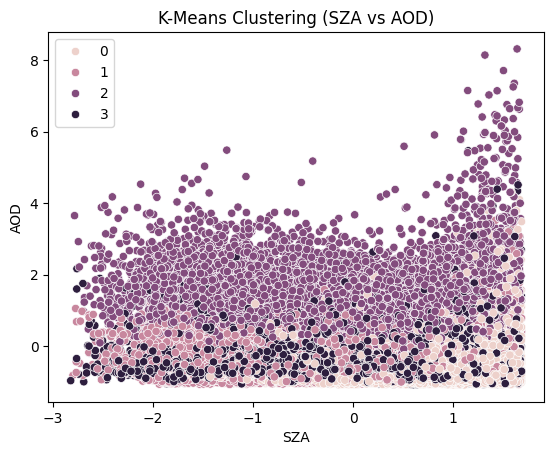

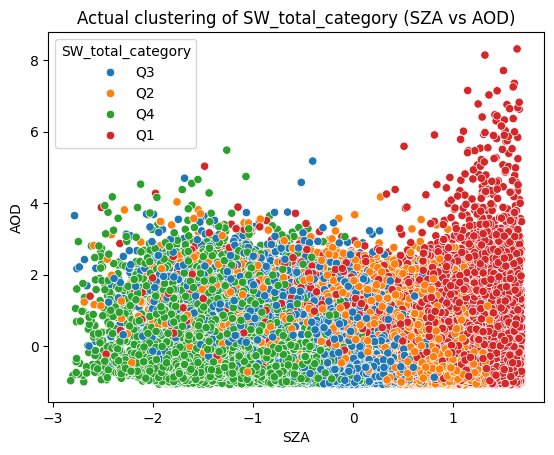

In [28]:
# Run kmeans with 4 clusters
kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(X_scaled)

sns.scatterplot(data=SF_with_AOD_scaled, x='SZA', y='AOD', hue = clusters)
plt.title('K-Means Clustering (SZA vs AOD)')
plt.show()

sns.scatterplot(data=SF_with_AOD_scaled, x='SZA', y='AOD', hue = 'SW_total_category')
plt.title('Actual clustering of SW_total_category (SZA vs AOD)')
plt.show()

# 3.1 Regression – Predicting SW_total (2 points)

    Train and evaluate two regression models:

        DecisionTreeRegressor

        RandomForestRegressor

    Report metrics: RMSE and R² on a held-out test set.

    Interpret feature importances from the random forest model.


In [45]:
X = SW_with_AOD[independent_feature_names]
y = SW_with_AOD['SW_total']

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2)

decisionTree = DecisionTreeRegressor()
decisionTree.fit(X_train, y_train)

y_pred = decisionTree.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print(f"Decision Tree Regression Scores: RMSE = {rmse:.2f}, R2 score = {r2:.3f}")

randomForest = RandomForestRegressor()
randomForest.fit(X_train, y_train)

y_pred = randomForest.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print(f"Random Forest Regression Scores: RMSE = {rmse:.2f}, R2 score = {r2:.3f}")



Decision Tree Regression Scores: RMSE = 140.48, R2 score = 0.600
Random Forest Regression Scores: RMSE = 97.92, R2 score = 0.806


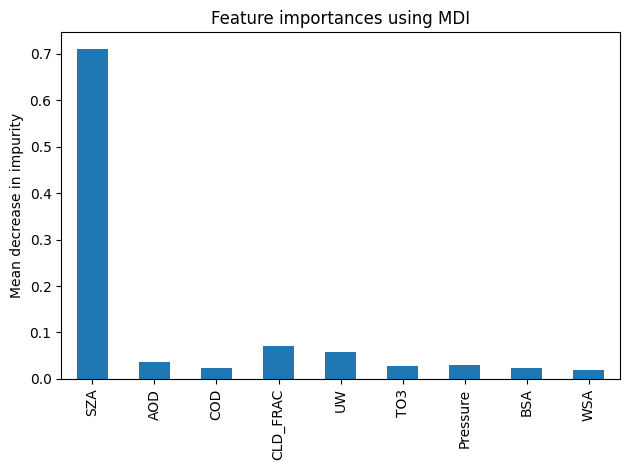

In [38]:
# Copied from your code
importances = randomForest.feature_importances_
importances

feature_names = ["SZA", "AOD", "COD", "CLD_FRAC", "UW", "TO3", "Pressure", "BSA", "WSA"]
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

As we can see, the SZA feature is by far the most important feature in making decisions in the random forest model, which agrees with the results we saw in class.

# 3.2 Classification – Predicting SW_total_category (2 points)

    Train and evaluate two classification models:

        KNeighborsClassifier

        GaussianNB

    Report classification accuracy, precision, recall, and show a confusion matrix.

    Discuss which model performs better and why.


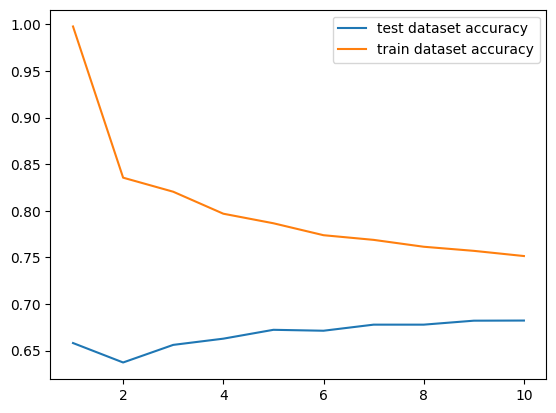

In [50]:
# First, let's find the optimal amount of neighbors to use using your code from Github
y = SW_with_AOD['SW_total_category']
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2)

nk = 10
train_accuracy = np.empty(nk)
test_accuracy = np.empty(nk)
for k in np.arange(1,nk+1):
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    train_accuracy[k-1] = knn.score(X_train,y_train)
    test_accuracy[k-1] = knn.score(X_test,y_test)

plt.plot(np.arange(1,nk+1), test_accuracy, label = "test dataset accuracy")
plt.plot(np.arange(1,nk+1), train_accuracy, label = "train dataset accuracy")
plt.legend()

In [51]:
# We will use two nearest neighbors
knn = KNeighborsClassifier(n_neighbors = 2)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

print('Metrics for KNN Classifier')
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.3f}")
print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.3f}")
print(f"Recall:    {recall_score(y_test, y_pred, average='weighted'):.3f}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)

print('Metrics for Gaussian NB Classifier')
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.3f}")
print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.3f}")
print(f"Recall:    {recall_score(y_test, y_pred, average='weighted'):.3f}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Metrics for KNN Classifier
Accuracy:  0.637
Precision: 0.648
Recall:    0.637
Confusion Matrix:
[[1455  223   46   18]
 [ 591  944  200   36]
 [ 178  475  966  165]
 [  74  112  438 1124]]
Metrics for Gaussian NB Classifier
Accuracy:  0.650
Precision: 0.653
Recall:    0.650
Confusion Matrix:
[[1183  430   80   49]
 [ 309 1059  292  111]
 [  56  420  988  320]
 [   3    9  390 1346]]


Both models perform quite similarly to classify the total short wave category, with similar metrics in accuracy, precision, in recall. However, it is clear that the Gaussian NB classifier has slightly better values in all three metrics, making it the slightly better classifier. But they are both similar in performance, and if we increased the number of niehgbors in the KNeighborClassifier, we might actually get a better performance for the KNN model.

# Part 4: Reflection and Recommendation (2 points)

From our regression analysis in Part3.1, it is clear that SZA, the solar zenith angle, is most important in predicting total shortwave radiation. This is because our random forest regressor, which had an R-squared value of 0.806, showed that the SZA was by far the most important feature in making its decisions to predict total shortwave radiation.

From my work in part 2.1, I found the K-means clustering to actually be misleading in its prediction of the SW_total_category. When we plot the SZA vs AOD, we can see that AOD seems to be the predominant feature in predicting the clustering for the model, which is contrary to the actual data which depends more on the SZA feature. Overall, the clusters and classification models do not perform that well, both qualitatively and quantitatively (metrics from part 3.2 don't show great results).

I would recommend the random forest regressor, which seems to perform very well according to its RMSE and R-squared value, especially in comparison with the decision tree regressor or other classification models.